In [1]:

# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES
# TO THE CORRECT LOCATION (/kaggle/input) IN YOUR NOTEBOOK,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.

import os
import sys
from tempfile import NamedTemporaryFile
from urllib.request import urlopen
from urllib.parse import unquote, urlparse
from urllib.error import HTTPError
from zipfile import ZipFile
import tarfile
import shutil

CHUNK_SIZE = 40960
DATA_SOURCE_MAPPING = 'penyakit:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F5133455%2F8583434%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240621%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240621T063938Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D23e0a4df4efccd82f5f877c13fbe6661b2485a6e7bc5f355e3fd2194357b4bb87d382713d6c58882a646cd596328eb577e0e1ffb343f56152f9e3cd873d2e06d02e7ad5331127098725062d789b008e6b76ac5b661e89df499b688cc8bc30e73063bb235f77f0863d2f50c506576b04d058c285450819c70e99497f4285d2232234273d864c2b0a33519ef616b3a6276a66076abad5add5e57e0f299cc8714121520f58529374dbc4d4e4376d7789e61bf0686f6bdfd3071bde1de3f981f357ea296586031bacef4131dd9482e0121be847ff233081ec914d3a3072411026f724d4df07dfd648f1797aa06428511d3dd3fd3132f782adaac147ac710779fa9f3'

KAGGLE_INPUT_PATH='/kaggle/input'
KAGGLE_WORKING_PATH='/kaggle/working'
KAGGLE_SYMLINK='kaggle'

!umount /kaggle/input/ 2> /dev/null
shutil.rmtree('/kaggle/input', ignore_errors=True)
os.makedirs(KAGGLE_INPUT_PATH, 0o777, exist_ok=True)
os.makedirs(KAGGLE_WORKING_PATH, 0o777, exist_ok=True)

try:
  os.symlink(KAGGLE_INPUT_PATH, os.path.join("..", 'input'), target_is_directory=True)
except FileExistsError:
  pass
try:
  os.symlink(KAGGLE_WORKING_PATH, os.path.join("..", 'working'), target_is_directory=True)
except FileExistsError:
  pass

for data_source_mapping in DATA_SOURCE_MAPPING.split(','):
    directory, download_url_encoded = data_source_mapping.split(':')
    download_url = unquote(download_url_encoded)
    filename = urlparse(download_url).path
    destination_path = os.path.join(KAGGLE_INPUT_PATH, directory)
    try:
        with urlopen(download_url) as fileres, NamedTemporaryFile() as tfile:
            total_length = fileres.headers['content-length']
            print(f'Downloading {directory}, {total_length} bytes compressed')
            dl = 0
            data = fileres.read(CHUNK_SIZE)
            while len(data) > 0:
                dl += len(data)
                tfile.write(data)
                done = int(50 * dl / int(total_length))
                sys.stdout.write(f"\r[{'=' * done}{' ' * (50-done)}] {dl} bytes downloaded")
                sys.stdout.flush()
                data = fileres.read(CHUNK_SIZE)
            if filename.endswith('.zip'):
              with ZipFile(tfile) as zfile:
                zfile.extractall(destination_path)
            else:
              with tarfile.open(tfile.name) as tarfile:
                tarfile.extractall(destination_path)
            print(f'\nDownloaded and uncompressed: {directory}')
    except HTTPError as e:
        print(f'Failed to load (likely expired) {download_url} to path {destination_path}')
        continue
    except OSError as e:
        print(f'Failed to load {download_url} to path {destination_path}')
        continue

print('Data source import complete.')


[==================================================] 273288009 bytes downloaded
Downloaded and uncompressed: penyakit
Data source import complete.


In [3]:
import random
import os
import glob
import time

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import tensorflow as tf
import tensorflow_hub as hub
from tensorflow.keras import layers, Sequential
from tensorflow.keras.utils import plot_model

from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, precision_recall_fscore_support
from sklearn.metrics import accuracy_score, f1_score, matthews_corrcoef
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

In [4]:
class CFG:
    EPOCHS = 10
    BATCH_SIZE = 32
    SEED = 42
    TF_SEED = 768
    HEIGHT = 224
    WIDTH = 224
    CHANNELS = 3
    IMAGE_SIZE = (224, 224, 3)

<a id='1'></a>
# 1 **|** Inspecting The Dataset
<div style="padding: 4px;color:white;margin:10;font-size:200%;text-align:center;display:fill;border-radius:10px;overflow:hidden;background-image: url(https://i.postimg.cc/KYdyWW8F/27525.jpg); background-size: 100% auto;"></div>

In [5]:
# Define paths
DATASET_PATH = "/kaggle/input/penyakit/"
TRAIN_PATH = '/kaggle/input/penyakit/train/'
TEST_PATH = '/kaggle/input/penyakit/test/'

In [6]:
# Generate a summary of the dataset
print('DATASET SUMMARY')
print('========================\n')
for dirpath, dirnames, filenames in os.walk(DATASET_PATH):
    print(f"There are {len(dirnames)} directories and {len(filenames)} images in {dirpath}")
print('\n========================')

DATASET SUMMARY

There are 3 directories and 0 images in /kaggle/input/penyakit/
There are 2 directories and 0 images in /kaggle/input/penyakit/test
There are 0 directories and 59 images in /kaggle/input/penyakit/test/normal
There are 0 directories and 316 images in /kaggle/input/penyakit/test/jerawat
There are 2 directories and 0 images in /kaggle/input/penyakit/train
There are 0 directories and 1042 images in /kaggle/input/penyakit/train/Jerawat
There are 0 directories and 1104 images in /kaggle/input/penyakit/train/normal
There are 2 directories and 0 images in /kaggle/input/penyakit/valid
There are 0 directories and 111 images in /kaggle/input/penyakit/valid/normal
There are 0 directories and 180 images in /kaggle/input/penyakit/valid/jerawat



<a id='1.1'></a>
### <font color='#478bd6'>Get image paths with glob</font>

In [7]:
%%time
train_images = glob.glob(f"{TRAIN_PATH}**/*.jpg")
test_images = glob.glob(f"{TEST_PATH}**/*.jpg")

CPU times: user 12.1 ms, sys: 692 µs, total: 12.8 ms
Wall time: 27.8 ms


<a id='1.2'></a>
### <font color='#478bd6'>View the number of images present in the dataset</font>

In [8]:
# Get train & test set sizes
train_size = len(train_images)
test_size = len(test_images)

# Get dataset size
total = train_size + test_size

# View samples counts
print(f'train samples count:\t\t{train_size}')
print(f'test samples count:\t\t{test_size}')
print('=======================================')
print(f'TOTAL:\t\t\t\t{total}')

train samples count:		2139
test samples count:		371
TOTAL:				2510


<a id='1.3'></a>
### <font color='#478bd6'>Create Pandas DataFrames for paths and labels</font>

In [9]:
def generate_labels(image_paths):
    return [_.split('/')[-2:][0] for _ in image_paths]


def build_df(image_paths, labels):
    # Create dataframe
    df = pd.DataFrame({
        'image_path': image_paths,
        'label': generate_labels(labels)
    })

    # Generate label encodings
    df['label_encoded'] = df.apply(lambda row: 0 if row.label == 'normal' else 1, axis=1)

    # Shuffle and return df
    return df.sample(frac=1, random_state=CFG.SEED).reset_index(drop=True)

In [10]:
# Build the DataFrames
train_df = build_df(train_images, generate_labels(train_images))
test_df = build_df(test_images, generate_labels(test_images))

In [11]:
# View first 5 samples in the training set
train_df.head(5)

,image_path,label,label_encoded
0,/kaggle/input/penyakit/train/Jerawat/acne5_jpg...,Jerawat,1
1,/kaggle/input/penyakit/train/Jerawat/R-3-_png_...,Jerawat,1
2,/kaggle/input/penyakit/train/normal/normal_d61...,normal,0
3,/kaggle/input/penyakit/train/normal/normal_77c...,normal,0
4,/kaggle/input/penyakit/train/Jerawat/pigmentat...,Jerawat,1


<a id='1.4'></a>
### <font color='#478bd6'>Load & View Random Sample Image</font>

In [12]:
def _load(image_path):
    # Read and decode an image file to a uint8 tensor
    image = tf.io.read_file(image_path)
    image = tf.io.decode_jpeg(image, channels=3)

    # Resize image
    image = tf.image.resize(image, [CFG.HEIGHT, CFG.WIDTH],
                            method=tf.image.ResizeMethod.LANCZOS3)

    # Convert image dtype to float32 and NORMALIZE!!!
    image = tf.cast(image, tf.float32)/255.

    # Return image
    return image

def view_sample(image, label, color_map='rgb', fig_size=(8, 10)):
    plt.figure(figsize=fig_size)

    if color_map=='rgb':
        plt.imshow(image)
    else:
        plt.imshow(tf.image.rgb_to_grayscale(image), cmap=color_map)

    plt.title(f'Label: {label}', fontsize=16)
    return

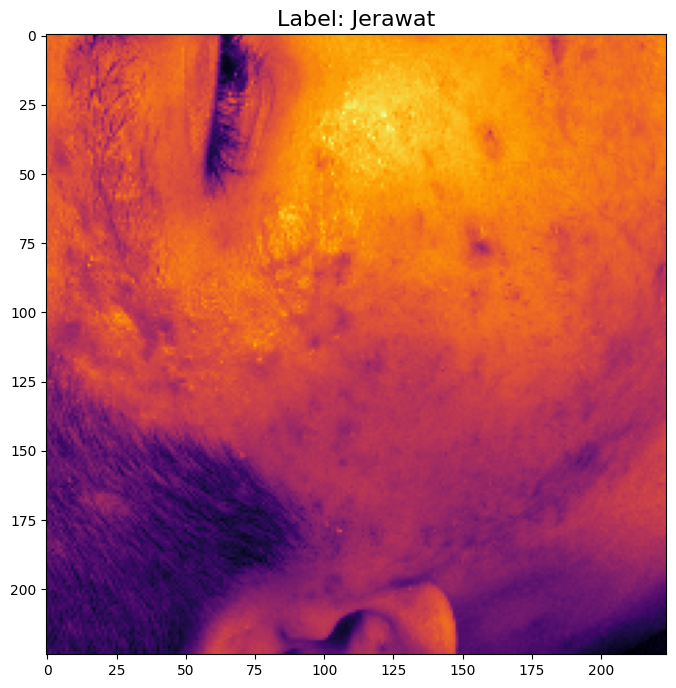

In [13]:
# Select random sample from train_df
idx = random.sample(train_df.index.to_list(), 1)[0]

# Load the random sample and label
sample_image, sample_label = _load(train_df.image_path[idx]), train_df.label[idx]

# View the random sample
view_sample(sample_image, sample_label, color_map='inferno')

<a id='1.5'></a>
### <font color='#478bd6'>View multiple random samples</font>

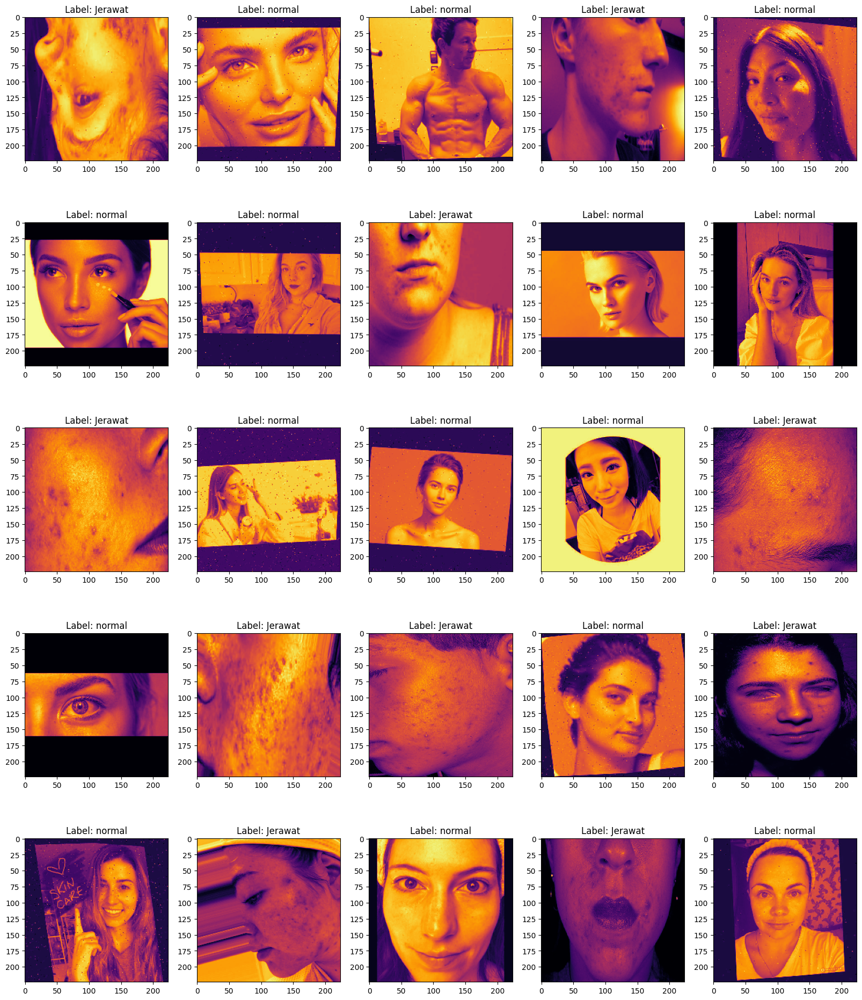

In [14]:
def view_mulitiple_samples(df, sample_loader, count=10, color_map='rgb', fig_size=(14, 10)):
    rows = count//5
    if count%5 > 0:
        rows +=1

    idx = random.sample(df.index.to_list(), count)
    fig = plt.figure(figsize=fig_size)

    for column, _ in enumerate(idx):
        plt.subplot(rows, 5, column+1)
        plt.title(f'Label: {df.label[_]}')

        if color_map=='rgb':
            plt.imshow(sample_loader(df.image_path[_]))
        else:
            plt.imshow(tf.image.rgb_to_grayscale(sample_loader(df.image_path[_])), cmap=color_map)

    return

view_mulitiple_samples(train_df, _load,
                       count=25, color_map='inferno',
                       fig_size=(20, 24))

<a id='1.6'></a>
### <font color='#478bd6'>View Train Labels Distribution</font>

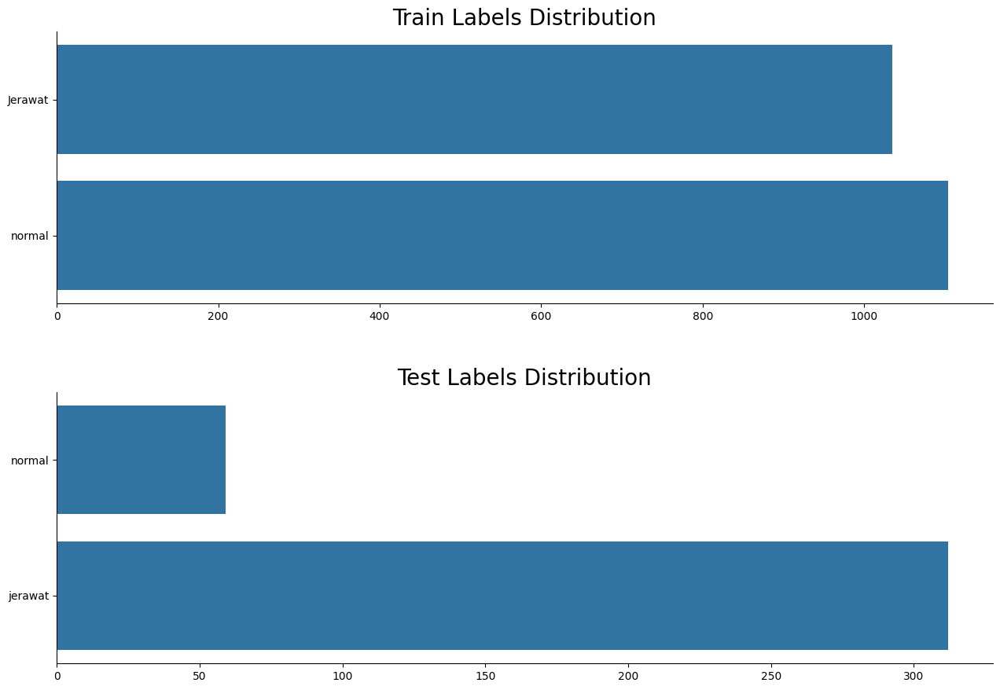

In [15]:
fig, (ax1, ax2) = plt.subplots(2, figsize=(14, 10))

# Set the spacing between subplots
fig.tight_layout(pad=6.0)

# Plot Train Labels Distribution
ax1.set_title('Train Labels Distribution', fontsize=20)
train_distribution = train_df['label'].value_counts().sort_values()
sns.barplot(x=train_distribution.values,
            y=list(train_distribution.keys()),
            orient="h",
            ax=ax1)

# Plot Test Labels Distribution
ax2.set_title('Test Labels Distribution', fontsize=20)
test_distribution = test_df['label'].value_counts().sort_values()
sns.barplot(x=test_distribution.values,
            y=list(test_distribution.keys()),
            orient="h",
            ax=ax2);

sns.despine();

<div class="alert alert-block alert-info">
    <h3>Observe</h3>
    We see that both the training and test sets are fairly balanced. However, we'll need to create a validation set for hyperparameter tuning.
</div>

<a id='2.1'></a>
### <font color='#478bd6'>Create Train & Validation Splits</font>

In [16]:
# Create Train/Val split with Training Set
train_split_idx, val_split_idx, _, _ = train_test_split(train_df.index,
                                                        train_df.label_encoded,
                                                        test_size=0.15,
                                                        stratify=train_df.label_encoded,
                                                        random_state=CFG.SEED)

In [17]:
# Get new training and validation data
train_new_df = train_df.iloc[train_split_idx].reset_index(drop=True)
val_df = train_df.iloc[val_split_idx].reset_index(drop=True)

# View shapes
train_new_df.shape, val_df.shape

((1818, 3), (321, 3))

<a id='2.2'></a>
### <font color='#478bd6'>View New Train & Validation Labels Distribution</font>

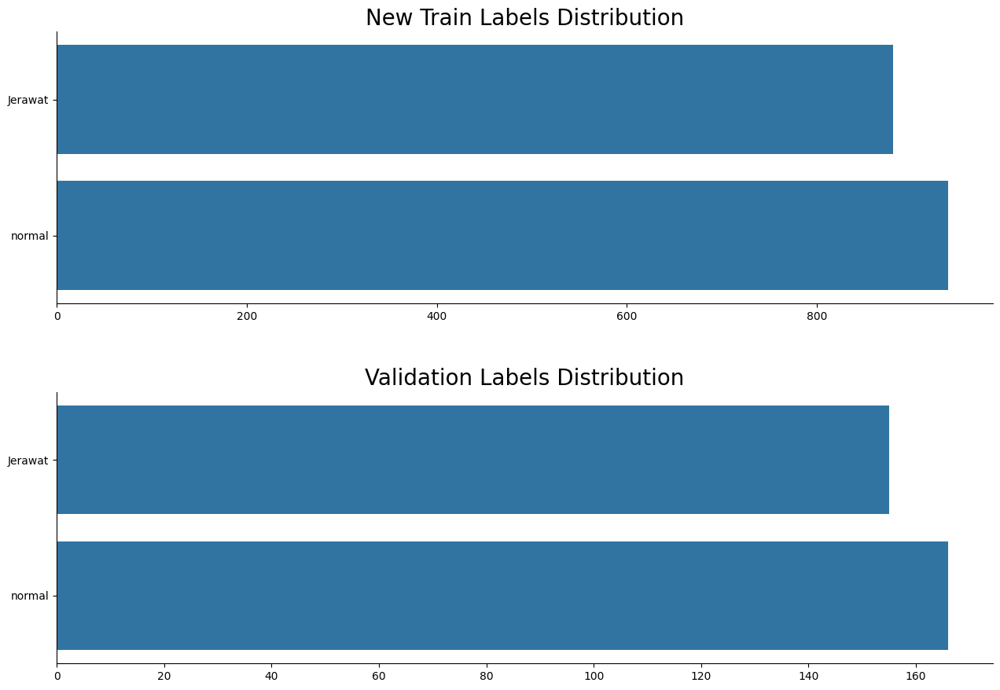

In [18]:
fig, (ax1, ax2) = plt.subplots(2, figsize=(14, 10))

# Set the spacing between subplots
fig.tight_layout(pad=6.0)

# Plot New Train Labels Distribution
ax1.set_title('New Train Labels Distribution', fontsize=20)
train_new_distribution = train_new_df['label'].value_counts().sort_values()
sns.barplot(x=train_new_distribution.values,
            y=list(train_new_distribution.keys()),
            orient="h",
            ax=ax1)

# Plot Validation Labels Distribution
ax2.set_title('Validation Labels Distribution', fontsize=20)
val_distribution = val_df['label'].value_counts().sort_values()
sns.barplot(x=val_distribution.values,
            y=list(val_distribution.keys()),
            orient="h",
            ax=ax2);

sns.despine();

<a id='2.3'></a>
### <font color='#478bd6'>Create an Image Data Augmentation Layer</font>

In [19]:
# Build augmentation layer
augmentation_layer = Sequential([
    layers.RandomFlip(mode='horizontal_and_vertical', seed=CFG.TF_SEED),
    layers.RandomZoom(height_factor=(-0.1, 0.1), width_factor=(-0.1, 0.1), seed=CFG.TF_SEED),
], name='augmentation_layer')

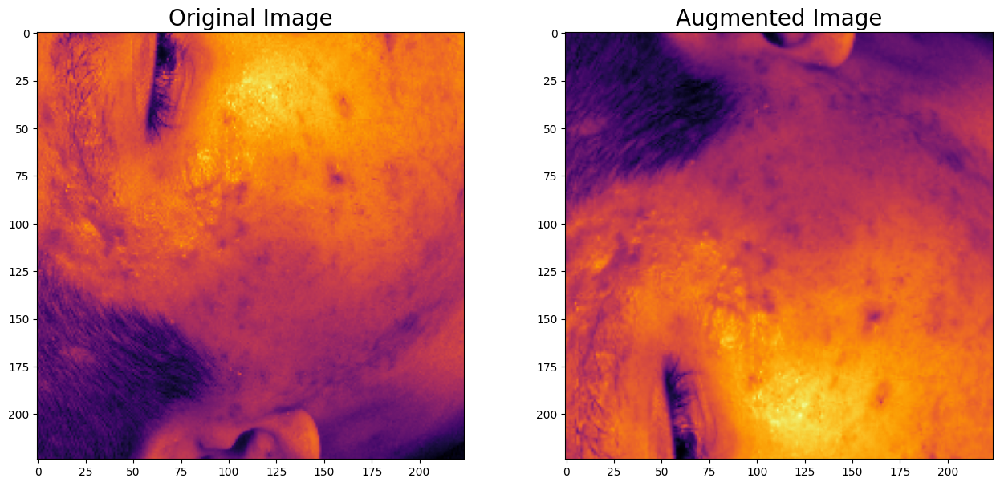

In [20]:
image = tf.image.rgb_to_grayscale(sample_image)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 10))

# Set the spacing between subplots
fig.tight_layout(pad=6.0)

# View Original Image
ax1.set_title('Original Image', fontsize=20)
ax1.imshow(image, cmap='inferno');

# View Augmented Image
ax2.set_title('Augmented Image', fontsize=20)
ax2.imshow(augmentation_layer(image), cmap='inferno');

<div class="alert alert-block alert-info">
    <h3>Observe</h3>
    The augmentation layer generates augmentations that are slightly different to the original images. This is intended as we aim to generate augmented images which are similar to that of the original dataset images while preserving the images key features.
</div>

<a id='2.4'></a>
### <font color='#478bd6'>Create Input Data Pipeline w. tf.data API</font>

In [21]:
def encode_labels(labels, encode_depth=2):
    return tf.one_hot(labels, depth=encode_depth).numpy()

def create_pipeline(df, load_function, augment=False, batch_size=32, shuffle=False, cache=None, prefetch=False):
    '''
    Generates an input pipeline using the tf.data API given a Pandas DataFrame and image loading function.

    @params
        - df: (pd.DataFrame) -> DataFrame containing paths and labels
        - load_function: (function) -> function used to load images given their paths
        - augment: (bool) -> condition for applying augmentation
        - batch_size: (int) -> size for batched (default=32)
        - shuffle: (bool) -> condition for data shuffling, data is shuffled when True (default=False)
        - cache: (str) -> cache path for caching data, data is not cached when None (default=None)
        - prefetch: (bool) -> condition for prefeching data, data is prefetched when True (default=False)

    @returns
        - dataset: (tf.data.Dataset) -> dataset input pipeline used to train a TensorFlow model
    '''
    # Get image paths and labels from DataFrame
    image_paths = df.image_path
    image_labels = encode_labels(df.label_encoded)
    AUTOTUNE = tf.data.AUTOTUNE

    # Create dataset with raw data from DataFrame
    ds = tf.data.Dataset.from_tensor_slices((image_paths, image_labels))

    # Map augmentation layer and load function to dataset inputs if augment is True
    # Else map only the load function
    if augment:
        ds = ds.map(lambda x, y: (augmentation_layer(load_function(x)), y), num_parallel_calls=AUTOTUNE)
    else:
        ds = ds.map(lambda x, y: (load_function(x), y), num_parallel_calls=AUTOTUNE)

    # Apply shuffling based on condition
    if shuffle:
        ds = ds.shuffle(buffer_size=1000)

    # Apply batching
    ds = ds.batch(batch_size)

    # Apply caching based on condition
    # Note: Use cache in memory (cache='') if the data is small enough to fit in memory!!!
    if cache != None:
        ds = ds.cache(cache)

    # Apply prefetching based on condition
    # Note: This will result in memory trade-offs
    if prefetch:
        ds = ds.prefetch(buffer_size=AUTOTUNE)

    # Return the dataset
    return ds

In [22]:
# Generate Train Input Pipeline
train_ds = create_pipeline(train_new_df, _load, augment=True,
                           batch_size=CFG.BATCH_SIZE,
                           shuffle=False, prefetch=True)

# Generate Validation Input Pipeline
val_ds = create_pipeline(val_df, _load,
                         batch_size=CFG.BATCH_SIZE,
                         shuffle=False, prefetch=False)

# Generate Test Input Pipeline
test_ds = create_pipeline(test_df, _load,
                          batch_size=CFG.BATCH_SIZE,
                          shuffle=False, prefetch=False)

In [23]:
# View string representation of datasets
print('========================================')
print('Train Input Data Pipeline:\n\n', train_ds)
print('========================================')
print('Validation Input Data Pipeline:\n\n', val_ds)
print('========================================')
print('Test Input Data Pipeline:\n\n', test_ds)
print('========================================')

Train Input Data Pipeline:

 <_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 2), dtype=tf.float32, name=None))>
Validation Input Data Pipeline:

 <_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 2), dtype=tf.float32, name=None))>
Test Input Data Pipeline:

 <_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 2), dtype=tf.float32, name=None))>


<a id='3.2'></a>
### <font color='#478bd6'>Define CNN Model</font>

In [24]:
def cnn_model():

    initializer = tf.keras.initializers.GlorotNormal()

    cnn_sequential = Sequential([
        layers.Input(shape=CFG.IMAGE_SIZE, dtype=tf.float32, name='input_image'),

        layers.Conv2D(16, kernel_size=3, activation='relu', kernel_initializer=initializer),
        layers.Conv2D(16, kernel_size=3, activation='relu', kernel_initializer=initializer),
        layers.MaxPool2D(pool_size=2, padding='valid'),

        layers.Conv2D(8, kernel_size=3, activation='relu', kernel_initializer=initializer),
        layers.Conv2D(8, kernel_size=3, activation='relu', kernel_initializer=initializer),
        layers.MaxPool2D(pool_size=2),

        layers.Flatten(),
        layers.Dropout(0.2),
        layers.Dense(128, activation='relu', kernel_initializer=initializer),
        layers.Dense(2, activation='sigmoid', kernel_initializer=initializer)
    ], name='cnn_sequential_model')

    return cnn_sequential

In [25]:
# Generate Model
model_cnn = cnn_model()

# Generate Summary of the Model
model_cnn.summary()

Model: "cnn_sequential_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 16)      448       
                                                                 
 conv2d_1 (Conv2D)           (None, 220, 220, 16)      2320      
                                                                 
 max_pooling2d (MaxPooling2  (None, 110, 110, 16)      0         
 D)                                                              
                                                                 
 conv2d_2 (Conv2D)           (None, 108, 108, 8)       1160      
                                                                 
 conv2d_3 (Conv2D)           (None, 106, 106, 8)       584       
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 53, 53, 8)         0         


/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


 g2D)                                                            
                                                                 
 flatten (Flatten)           (None, 22472)             0         
                                                                 
 dropout (Dropout)           (None, 22472)             0         
                                                                 
 dense (Dense)               (None, 128)               2876544   
                                                                 
 dense_1 (Dense)             (None, 2)                 258       
                                                                 
Total params: 2881314 (10.99 MB)
Trainable params: 2881314 (10.99 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


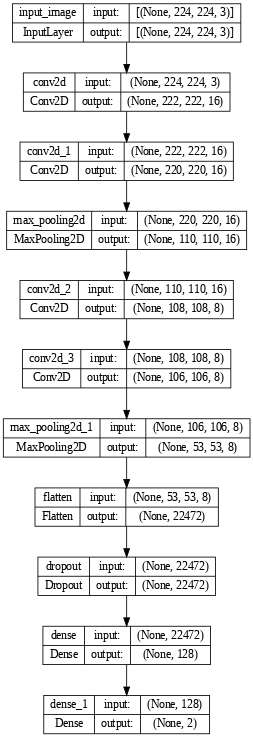

In [26]:
# Explore model visually
plot_model(
    model_cnn, dpi=60,
    show_shapes=True
)

In [27]:
def train_model(model, num_epochs, callbacks_list, tf_train_data,
                tf_valid_data=None, shuffling=False):
    '''
        Trains a TensorFlow model and returns a dict object containing the model metrics history data.

        @params
        - model: (tf.keras.model) -> model to be trained
        - num_epochs: (int) -> number of epochs to train the model
        - callbacks_list: (list) -> list containing callback fuctions for model
        - tf_train_data: (tf.data.Dataset) -> dataset for model to be train on
        - tf_valid_data: (tf.data.Dataset) -> dataset for model to be validated on (default=None)
        - shuffling: (bool) -> condition for data shuffling, data is shuffled when True (default=False)

        @returns
        - model_history: (dict) -> dictionary containing loss and metrics values tracked during training
    '''

    model_history = {}

    if tf_valid_data != None:
        model_history = model.fit(tf_train_data,
                                  epochs=num_epochs,
                                  validation_data=tf_valid_data,
                                  validation_steps=int(len(tf_valid_data)),
                                  callbacks=callbacks_list,
                                  shuffle=shuffling)

    if tf_valid_data == None:
        model_history = model.fit(tf_train_data,
                                  epochs=num_epochs,
                                  callbacks=callbacks_list,
                                  shuffle=shuffling)
    return model_history

In [28]:
# Define Early Stopping Callback
early_stopping_callback = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=3,
    restore_best_weights=True)

# Define Reduce Learning Rate Callback
reduce_lr_callback = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    patience=2,
    factor=0.1,
    verbose=1)

# Define Callbacks and Metrics lists
CALLBACKS = [early_stopping_callback, reduce_lr_callback]
METRICS = ['accuracy']

In [29]:
tf.random.set_seed(CFG.SEED)

# Compile the model
model_cnn.compile(
    loss=tf.keras.losses.BinaryCrossentropy(),
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    metrics=METRICS
)

# Train the model
print(f'Training {model_cnn.name}.')
print(f'Train on {len(train_new_df)} samples, validate on {len(val_df)} samples.')
print('----------------------------------')

cnn_history = train_model(
    model_cnn, CFG.EPOCHS, CALLBACKS,
    train_ds, val_ds,
    shuffling=False
)

Training cnn_sequential_model.
Train on 1818 samples, validate on 321 samples.
----------------------------------
Epoch 1/10
57/57 [==============================] - 174s 3s/step - loss: 0.3894 - accuracy: 0.8471 - val_loss: 0.2004 - val_accuracy: 0.9283 - lr: 0.0010
Epoch 2/10
57/57 [==============================] - 162s 3s/step - loss: 0.1781 - accuracy: 0.9334 - val_loss: 0.1483 - val_accuracy: 0.9408 - lr: 0.0010
Epoch 3/10
57/57 [==============================] - 163s 3s/step - loss: 0.1358 - accuracy: 0.9488 - val_loss: 0.1029 - val_accuracy: 0.9626 - lr: 0.0010
Epoch 4/10
57/57 [==============================] - 167s 3s/step - loss: 0.1320 - accuracy: 0.9527 - val_loss: 0.0909 - val_accuracy: 0.9688 - lr: 0.0010
Epoch 5/10
57/57 [==============================] - 162s 3s/step - loss: 0.1156 - accuracy: 0.9615 - val_loss: 0.0714 - val_accuracy: 0.9751 - lr: 0.0010
Epoch 6/10
57/57 [==============================] - 161s 3s/step - loss: 0.1201 - accuracy: 0.9554 - val_loss: 0.108

In [30]:
# Evaluate the model
cnn_evaluation = model_cnn.evaluate(test_ds)

12/12 [==============================] - 10s 798ms/step - loss: 0.0666 - accuracy: 0.9704


In [31]:
# Generate model probabilities and associated predictions
cnn_test_probabilities = model_cnn.predict(test_ds, verbose=1)
cnn_test_predictions = tf.argmax(cnn_test_probabilities, axis=1)

12/12 [==============================] - 10s 694ms/step


<a id='6.1'></a>
### <font color='#478bd6'>Plot Model Histories</font>

In [32]:
def plot_training_curves(history):

    loss = np.array(history.history['loss'])
    val_loss = np.array(history.history['val_loss'])

    accuracy = np.array(history.history['accuracy'])
    val_accuracy = np.array(history.history['val_accuracy'])

    epochs = range(len(history.history['loss']))

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

    # Plot loss
    ax1.plot(epochs, loss, label='training_loss', marker='o')
    ax1.plot(epochs, val_loss, label='val_loss', marker='o')

    ax1.fill_between(epochs, loss, val_loss, where=(loss > val_loss), color='C0', alpha=0.3, interpolate=True)
    ax1.fill_between(epochs, loss, val_loss, where=(loss < val_loss), color='C1', alpha=0.3, interpolate=True)

    ax1.set_title('Loss (Lower Means Better)', fontsize=16)
    ax1.set_xlabel('Epochs', fontsize=12)
    ax1.legend()

    # Plot accuracy
    ax2.plot(epochs, accuracy, label='training_accuracy', marker='o')
    ax2.plot(epochs, val_accuracy, label='val_accuracy', marker='o')

    ax2.fill_between(epochs, accuracy, val_accuracy, where=(accuracy > val_accuracy), color='C0', alpha=0.3, interpolate=True)
    ax2.fill_between(epochs, accuracy, val_accuracy, where=(accuracy < val_accuracy), color='C1', alpha=0.3, interpolate=True)

    ax2.set_title('Accuracy (Higher Means Better)', fontsize=16)
    ax2.set_xlabel('Epochs', fontsize=12)
    ax2.legend();

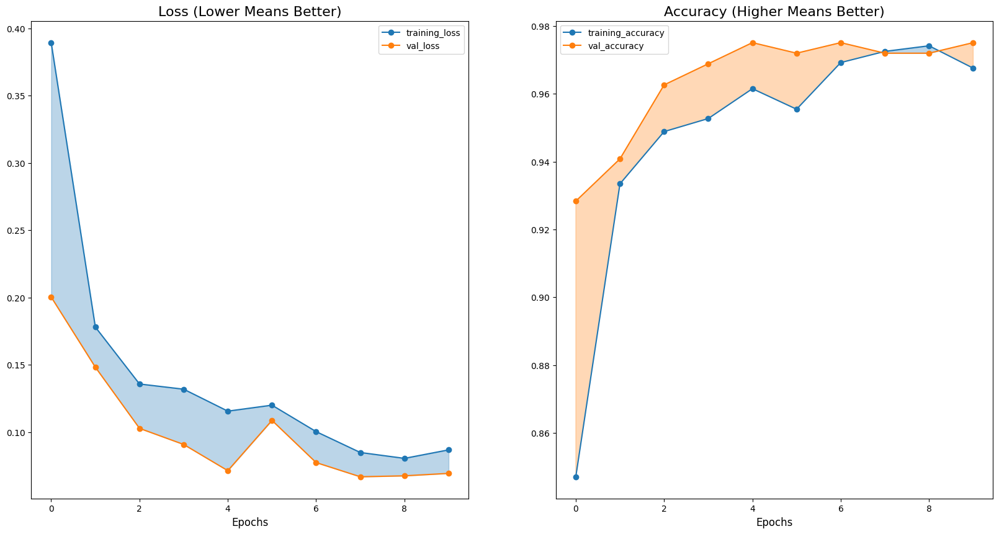

In [33]:
# plot cnn model training history
plot_training_curves(cnn_history)

<a id='6.2'></a>
### <font color='#478bd6'>Plot Confusion Matrix</font>

In [34]:
def plot_confusion_matrix(y_true, y_pred, classes='auto', figsize=(10, 10), text_size=12):
    # Generate confusion matrix
    cm = confusion_matrix(y_true, y_pred)

    # Set plot size
    plt.figure(figsize=figsize)

    # Create confusion matrix heatmap
    disp = sns.heatmap(
        cm, annot=True, cmap='Greens',
        annot_kws={"size": text_size}, fmt='g',
        linewidths=1, linecolor='black', clip_on=False,
        xticklabels=classes, yticklabels=classes)

    # Set title and axis labels
    disp.set_title('Confusion Matrix', fontsize=24)
    disp.set_xlabel('Predicted Label', fontsize=20)
    disp.set_ylabel('True Label', fontsize=20)
    plt.yticks(rotation=0)

    # Plot confusion matrix
    plt.show()

    return

### <font color='#478bd6'>CNN Confusion Matrix</font>

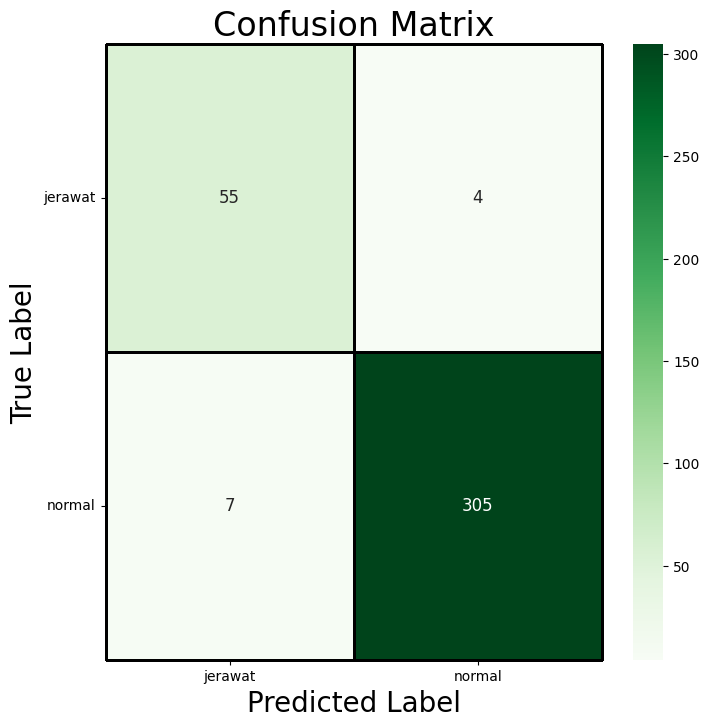

In [35]:
class_names = ['jerawat', 'normal']

plot_confusion_matrix(
    test_df.label_encoded,
    cnn_test_predictions,
    figsize=(8, 8),
    classes=class_names)

In [36]:
def compute_inference_time(model, ds, sample_count, inference_runs=5):
    total_inference_times = []
    inference_rates = []

    for _ in range(inference_runs):
        start = time.perf_counter()
        model.predict(ds)
        end = time.perf_counter()

        # Compute total inference time
        total_inference_time = end - start

        # Compute inference rate
        inference_rate = total_inference_time / sample_count

        total_inference_times.append(total_inference_time)
        inference_rates.append(inference_rate)

    # Calculate average total inference time with uncertainty
    avg_inference_time = sum(total_inference_times) / len(total_inference_times)
    avg_inference_time_uncertainty = (max(total_inference_times) - min(total_inference_times)) / 2

    # Calculate average inference rate with uncertainty
    avg_inference_rate = sum(inference_rates) / len(inference_rates)
    avg_inference_rate_uncertainty = (max(inference_rates) - min(inference_rates)) / 2

    print('====================================================')
    print(f'Model:\t\t{model.name}\n')
    print(f'Inference Time:\t{round(avg_inference_time, 6)}s \xB1 {round(avg_inference_time_uncertainty, 6)}s')
    print(f'Inference Rate:\t{round(avg_inference_rate, 6)}s/sample \xB1 {round(avg_inference_rate_uncertainty, 6)}s/sample')
    print('====================================================')

    return avg_inference_time, avg_inference_rate

<a id='6.7'></a>
### <font color='#478bd6'>View Test Predictions</font>

In [37]:
test_df

,image_path,label,label_encoded
0,/kaggle/input/penyakit/test/jerawat/43.jpg,jerawat,1
1,/kaggle/input/penyakit/test/normal/normal_017e...,normal,0
2,/kaggle/input/penyakit/test/normal/normal_8d9e...,normal,0
3,/kaggle/input/penyakit/test/jerawat/acne-face-...,jerawat,1
4,/kaggle/input/penyakit/test/normal/normal_247f...,normal,0
...,...,...,...
366,/kaggle/input/penyakit/test/jerawat/acne-pustu...,jerawat,1
367,/kaggle/input/penyakit/test/jerawat/acne-face-...,jerawat,1
368,/kaggle/input/penyakit/test/jerawat/pigmentati...,jerawat,1
369,/kaggle/input/penyakit/test/jerawat/acne-face-...,jerawat,1


In [38]:
def view_multiple_predictions(df, model, sample_loader, count=10, color_map='rgb', title=None, fig_size=(14, 10)):
    rows = count//5
    if count%5 > 0:
        rows +=1

    idx = random.sample(df.index.to_list(), count)

    fig = plt.figure(figsize=fig_size)
    if title != None:
        fig.suptitle(title, fontsize=30)

    fig.tight_layout()
    fig.subplots_adjust(top=0.95)

    # Setup useful dictionaries
    label_set = {0: 'normal', 1: 'jerawat'}
    color_set = {False: 'red', True: 'darkgreen'}

    for column, _ in enumerate(idx):
        # Predict label
        img = sample_loader(df.image_path[_])
        probability = np.squeeze(
            model.predict(np.array([img]), verbose=0)
        )
        prediction = np.argmax(probability)

        # Validate prediction correctness
        correct_prediction = (prediction == df.label_encoded[_])

        # Create subplot and assign title
        ax = plt.subplot(rows, 5, column+1)
        ax.set_title(
            f'Actual Label: {df.label[_]}',
            pad=20,
            fontsize=14,
            color=color_set[correct_prediction]
        )

        # Plot image
        if color_map=='rgb':
            ax.imshow(img)
        else:
            ax.imshow(tf.image.rgb_to_grayscale(img), cmap=color_map)

        # Plot prediction  & probability
        txt = f'Prediction: {label_set[prediction]}\nProbability: {(100 * probability[prediction]):.2f}%'
        plt.xlabel(txt, fontsize=14, color=color_set[correct_prediction])

    return

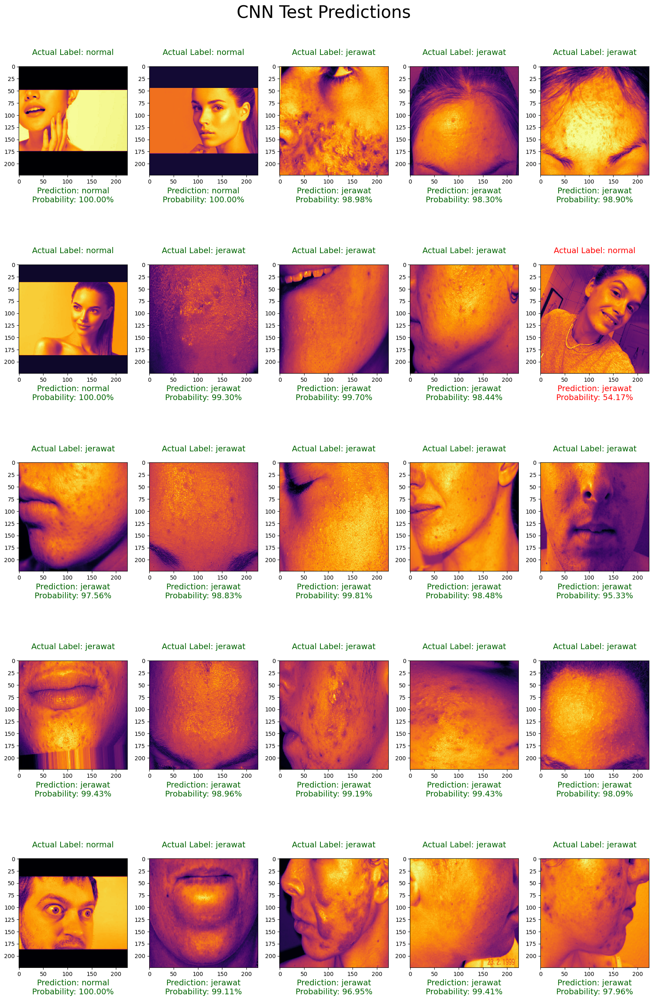

In [39]:
# View CNN predictions
view_multiple_predictions(
    test_df,
    model_cnn,
    _load,
    count=25,
    color_map='inferno',
    title='CNN Test Predictions',
    fig_size=(20, 28)
)

In [40]:
# Simpan model dalam format H5
model_cnn.save('model_cnn.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [41]:
import tensorflow as tf

# Muat model
model = tf.keras.models.load_model('model_cnn.h5')


In [42]:
# Buat converter
converter = tf.lite.TFLiteConverter.from_keras_model(model)

# Konversi model ke format TFLite
tflite_model = converter.convert()

# Simpan model TFLite
with open('model_cnn.tflite', 'wb') as f:
    f.write(tflite_model)


In [43]:
import tensorflow as tf

# Load the TFLite model
interpreter = tf.lite.Interpreter(model_path='model_cnn.tflite')
interpreter.allocate_tensors()

# Get input and output tensors
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()


In [44]:
import matplotlib.pyplot as plt
import numpy as np
import random

def view_multiple_predictions(df, interpreter, sample_loader, count=10, color_map='rgb', title=None, fig_size=(14, 10)):
    rows = count // 5
    if count % 5 > 0:
        rows += 1

    idx = random.sample(df.index.to_list(), count)

    fig = plt.figure(figsize=fig_size)
    if title is not None:
        fig.suptitle(title, fontsize=30)

    fig.tight_layout()
    fig.subplots_adjust(top=0.95)

    # Setup useful dictionaries
    label_set = {0: 'normal', 1: 'jerawat'}
    color_set = {False: 'red', True: 'darkgreen'}

    for column, _ in enumerate(idx):
        # Predict label
        img = sample_loader(df.image_path[_])
        input_data = np.expand_dims(img, axis=0).astype(np.float32)

        interpreter.set_tensor(input_details[0]['index'], input_data)
        interpreter.invoke()
        probability = interpreter.get_tensor(output_details[0]['index'])
        prediction = np.argmax(probability)

        # Validate prediction correctness
        correct_prediction = (prediction == df.label_encoded[_])

        # Create subplot and assign title
        ax = plt.subplot(rows, 5, column + 1)
        ax.set_title(
            f'Actual Label: {df.label[_]}',
            pad=20,
            fontsize=14,
            color=color_set[correct_prediction]
        )

        # Plot image
        if color_map == 'rgb':
            ax.imshow(img)
        else:
            ax.imshow(tf.image.rgb_to_grayscale(img), cmap=color_map)

        # Plot prediction & probability
        txt = f'Prediction: {label_set[prediction]}\nProbability: {(100 * probability[0][prediction]):.2f}%'
        plt.xlabel(txt, fontsize=14, color=color_set[correct_prediction])

    plt.show()


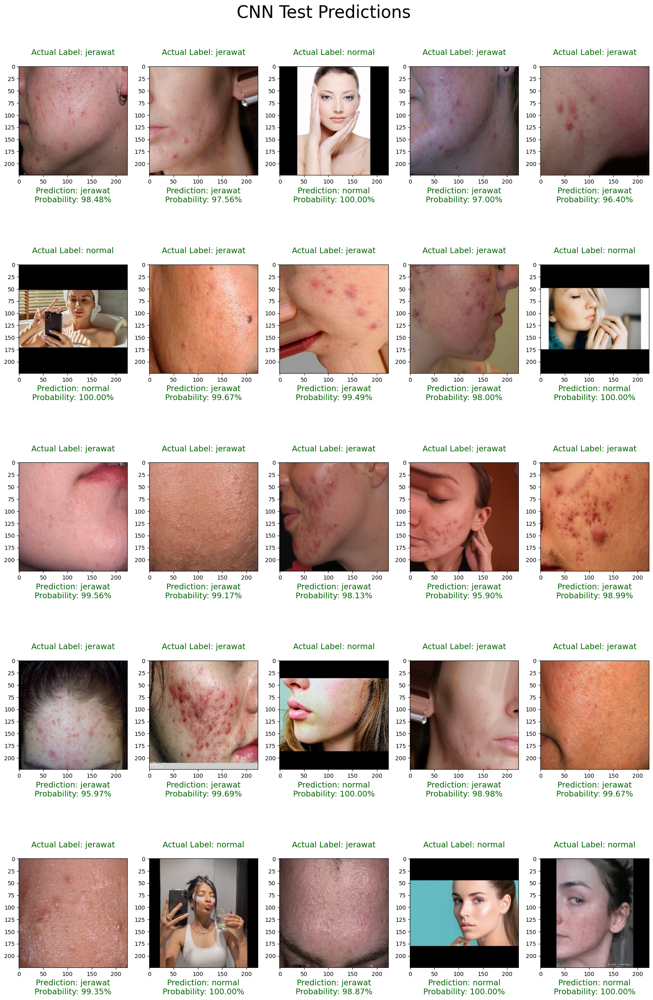

In [45]:
# Contoh fungsi untuk memuat dan memproses gambar
def sample_loader(image_path):
    img = tf.keras.preprocessing.image.load_img(image_path, target_size=(224, 224))
    img = tf.keras.preprocessing.image.img_to_array(img)
    img = img / 255.0  # Normalisasi jika diperlukan
    return img

# Panggil fungsi untuk melihat prediksi pada dataset uji tanpa colormap inferno
view_multiple_predictions(
    test_df,         # DataFrame dataset uji
    interpreter,     # TFLite Interpreter
    sample_loader,   # Fungsi untuk memuat gambar
    count=25,
    color_map='rgb',  # Default color map atau bisa diganti dengan 'grayscale'
    title='CNN Test Predictions',
    fig_size=(20, 28)
)
